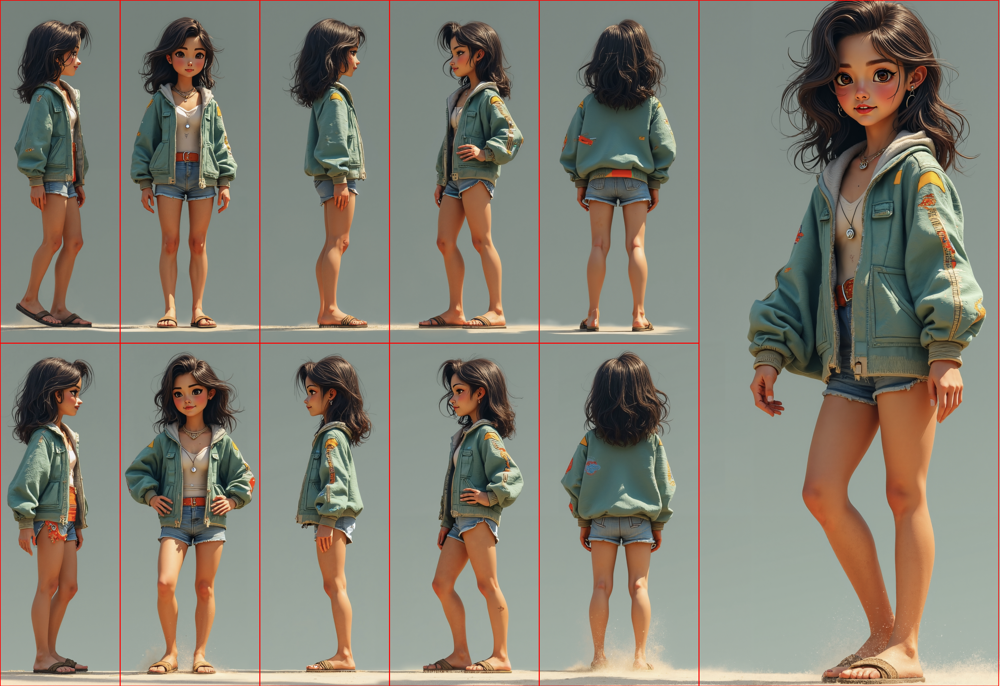

In [36]:
from PIL import Image, ImageDraw

def draw_crop_lines(input_path, column_widths=None, margin=10):
    """
    Reads the input image and draws crop lines for sub-images based on column width percentages.
    The last column spans both rows.
    
    Args:
        input_path: Path to the input image
        column_widths: List of width percentages for each column (should sum to 1.0)
        margin: Margin between cells in pixels
    """
    # Open the image
    img = Image.open(input_path).convert("RGBA")
    img_w, img_h = img.size
    
    # Use default equal widths if none provided
    if column_widths is None:
        column_widths = [0.2] * 5  # 5 equal columns
    
    # Validate column widths
    if abs(sum(column_widths) - 1.0) > 0.001:
        raise ValueError("Column widths must sum to 1.0")
    
    # Create a copy to draw on
    draw_img = img.copy()
    draw = ImageDraw.Draw(draw_img)
    
    # The image is arranged in 2 rows
    n_cols = len(column_widths)
    n_rows = 2
    
    # Calculate cell height
    cell_h = (img_h - (n_rows + 1) * margin) // n_rows
    
    # Draw lines for all columns
    x_pos = margin
    for col, width_pct in enumerate(column_widths):
        cell_w = int(width_pct * (img_w - (n_cols + 1) * margin))
        
        if col == len(column_widths) - 1:  # Last column
            # Draw one tall rectangle spanning both rows
            y0 = margin
            y1 = y0 + 2 * cell_h + margin
            draw.rectangle([x_pos, y0, x_pos + cell_w, y1], outline="red", width=2)
        else:
            # Draw two separate rectangles for other columns
            for row in range(n_rows):
                y0 = margin + row * (cell_h + margin)
                y1 = y0 + cell_h
                draw.rectangle([x_pos, y0, x_pos + cell_w, y1], outline="red", width=2)
        
        x_pos += cell_w + margin
    
    # Display the image with crop lines
    display(draw_img)

# Example usage:
draw_crop_lines("image.png", column_widths=[0.12, 0.14, 0.13, 0.15, 0.16, 0.3], margin=0)  # Custom column widths

In [38]:
def crop_and_save(input_path, output_dir, column_widths=None, margin=10):
    """
    Crops the input image into sub-images based on column width percentages and saves them.
    The last column spans both rows. Each cropped image is extended to a square using the background color.
    
    Args:
        input_path: Path to the input image
        output_dir: Directory to save the cropped images
        column_widths: List of width percentages for each column (should sum to 1.0)
        margin: Margin between cells in pixels
    """
    # Open the image
    img = Image.open(input_path).convert("RGBA")
    img_w, img_h = img.size
    
    # Use default equal widths if none provided
    if column_widths is None:
        column_widths = [0.2] * 5  # 5 equal columns
    
    # Validate column widths
    if abs(sum(column_widths) - 1.0) > 0.001:
        raise ValueError("Column widths must sum to 1.0")
    
    # Create output directory if it doesn't exist
    import os
    os.makedirs(output_dir, exist_ok=True)
    
    # The image is arranged in 2 rows
    n_cols = len(column_widths)
    n_rows = 2
    
    # Calculate cell height
    cell_h = (img_h - (n_rows + 1) * margin) // n_rows
    
    # Crop and save each section
    x_pos = margin
    for col, width_pct in enumerate(column_widths):
        cell_w = int(width_pct * (img_w - (n_cols + 1) * margin))
        
        if col == len(column_widths) - 1:  # Last column
            # Crop one tall rectangle spanning both rows
            y0 = margin
            y1 = y0 + 2 * cell_h + margin
            cropped = img.crop((x_pos, y0, x_pos + cell_w, y1))
            
            # Get background color from top-left pixel
            bg_color = cropped.getpixel((0, 0))
            
            # Create square image with background color
            size = max(cropped.width, cropped.height)
            square = Image.new('RGBA', (size, size), bg_color)
            
            # Paste cropped image in center
            paste_x = (size - cropped.width) // 2
            paste_y = (size - cropped.height) // 2
            square.paste(cropped, (paste_x, paste_y), cropped)
            
            square.save(os.path.join(output_dir, f"col_{col}_full.png"))
        else:
            # Crop two separate rectangles for other columns
            for row in range(n_rows):
                y0 = margin + row * (cell_h + margin)
                y1 = y0 + cell_h
                cropped = img.crop((x_pos, y0, x_pos + cell_w, y1))
                
                # Get background color from top-left pixel
                bg_color = cropped.getpixel((0, 0))
                
                # Create square image with background color
                size = max(cropped.width, cropped.height)
                square = Image.new('RGBA', (size, size), bg_color)
                
                # Paste cropped image in center
                paste_x = (size - cropped.width) // 2
                paste_y = (size - cropped.height) // 2
                square.paste(cropped, (paste_x, paste_y), cropped)
                
                square.save(os.path.join(output_dir, f"col_{col}_row_{row}.png"))
        
        x_pos += cell_w + margin

# Example usage:
crop_and_save("image.png", "cropped_images", column_widths=[0.12, 0.14, 0.13, 0.15, 0.16, 0.3], margin=0)